In [106]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/df-main/df_main.csv
/kaggle/input/datath/datasetX3_reverse.pt
/kaggle/input/embedding-work/combined_embedding.csv


In [107]:
np.random.seed(42)

In [108]:
import torch

In [109]:
from transformers import pipeline

pipe = pipeline("text-classification", model="phoner45/wangchan-sentiment-thai-text-model")

Device set to use cpu


In [110]:
# Load model directly
from transformers import AutoTokenizer, AutoModelForSequenceClassification, AutoModel

tokenizer = AutoTokenizer.from_pretrained("phoner45/wangchan-sentiment-thai-text-model")
model = AutoModel.from_pretrained("phoner45/wangchan-sentiment-thai-text-model")

Some weights of CamembertModel were not initialized from the model checkpoint at phoner45/wangchan-sentiment-thai-text-model and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [111]:
df = pd.read_csv("/kaggle/input/df-main/df_main.csv")
df.head(2)

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,img_id,sentences,text_length,word_list,Negative,Neutral,Positive,has_cta,ctr,ctr_group
0,0.708480,0.759826,0.449038,0.476864,0.791149,0.541827,0.389004,0.282455,0.802612,0.318787,...,c7e254ff6e829bbd379c791c06dba26a,วันนี - 14 มีนาคม 2568 รีบด่วน 400 web hosting,46,"['วัน', 'นี', ' ', '-', ' ', '14', ' ', 'มีนาค...",0,16,0,False,0.000000,Low
1,0.733801,0.642118,0.425671,0.490838,0.708187,0.605140,0.204538,0.374215,0.633562,0.262923,...,310f05853aa67594eadcecfaeab260c9,แฟลชเซล มาก่อน ได้ก่อน 899 12 00 น.,35,"['แฟลช', 'เซ', 'ล', ' ', 'มา', 'ก่อน', ' ', 'ไ...",0,1,0,False,0.016482,Low


In [112]:
def get_bert_embedding(text):
    tokens = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        output = model(**tokens)
    embedding = output.last_hidden_state.mean(dim=1).squeeze().numpy()
    return embedding

In [113]:
df['sentence_embeddings'] = df['sentences'].apply(get_bert_embedding)

In [114]:
df['word_embeddings'] = df['word_list'].apply(get_bert_embedding)

In [115]:
df.columns

Index(['feature_0', 'feature_1', 'feature_2', 'feature_3', 'feature_4',
       'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9',
       ...
       'text_length', 'word_list', 'Negative', 'Neutral', 'Positive',
       'has_cta', 'ctr', 'ctr_group', 'sentence_embeddings',
       'word_embeddings'],
      dtype='object', length=141)

In [116]:
# df.to_csv('combined_embedding.csv', index=False)

In [117]:
import ast
from sklearn.metrics.pairwise import cosine_similarity

In [118]:
sent_embed = np.stack(df['sentence_embeddings'].values)
word_embed = np.stack(df['word_embeddings'].values)

consine for sentences and word embeddings

In [119]:
cos_sim = np.array([
    cosine_similarity(sent_embed[i].reshape(1, -1), word_embed[i].reshape(1, -1))[0][0]
    for i in range(len(df))
])

df['embedding_cos_sim'] = cos_sim

In [120]:
print(type(df['sentence_embeddings'][0]), len(df['sentence_embeddings'][0]))

<class 'numpy.ndarray'> 768


In [121]:
df['embedding_cos_sim'] = cos_sim

In [122]:
df['embedding_cos_sim']

0       0.536670
1       0.502119
2       0.574336
3       0.507568
4       0.620794
          ...   
1110    0.799550
1111    0.660865
1112    0.599210
1113    0.462548
1114    0.441794
Name: embedding_cos_sim, Length: 1115, dtype: float32

In [123]:
df

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,word_list,Negative,Neutral,Positive,has_cta,ctr,ctr_group,sentence_embeddings,word_embeddings,embedding_cos_sim
0,0.708480,0.759826,0.449038,0.476864,0.791149,0.541827,0.389004,0.282455,0.802612,0.318787,...,"['วัน', 'นี', ' ', '-', ' ', '14', ' ', 'มีนาค...",0,16,0,False,0.000000,Low,"[1.9249656, -1.1482828, -0.25647768, -0.198943...","[1.4809455, -0.124824405, -0.8571908, 1.193851...",0.536670
1,0.733801,0.642118,0.425671,0.490838,0.708187,0.605140,0.204538,0.374215,0.633562,0.262923,...,"['แฟลช', 'เซ', 'ล', ' ', 'มา', 'ก่อน', ' ', 'ไ...",0,1,0,False,0.016482,Low,"[0.5988743, -0.8474121, -0.8484417, 0.3760249,...","[1.0963709, 0.13514143, -0.7340203, 1.1285696,...",0.502119
2,0.587095,0.655419,0.328038,0.582514,0.626008,0.675075,0.503859,0.556132,0.578276,0.380239,...,"['ifex', ' ', 'prc', ' ', 'ติว', 'เข้ม', ' ', ...",0,6,0,False,0.000000,Low,"[-0.15545496, -0.94289625, -0.40212044, 1.1409...","[0.8593514, -0.6384615, -1.1777972, 1.9251543,...",0.574336
3,0.353129,0.343184,0.522671,0.418777,0.223161,0.525447,0.458935,0.600709,0.323766,0.623137,...,"['สร้าง', 'รายได้', 'เสริม', 'จาก', 'ที่', 'บ้...",0,37,0,True,0.000000,Low,"[0.54072624, -0.33284494, 0.52688557, -0.26157...","[0.9857843, -0.5182989, -0.6827191, 1.3789423,...",0.507568
4,0.570452,0.067015,0.308653,0.352218,0.347666,0.537102,0.193613,0.497158,0.483621,0.717515,...,"['uniol', '0', ' ', 'management', ' ', 'candid...",0,17,0,True,0.000000,Low,"[0.9832803, -0.8853229, 0.201369, 0.26472697, ...","[0.8781025, -0.59901005, -0.8466322, 1.1779596...",0.620794
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1110,0.501477,0.709318,0.594054,0.468367,0.402899,0.624929,0.440527,0.272052,0.834530,0.241055,...,"['empty', '_record']",0,0,0,False,0.072270,High,"[-0.54987603, 0.057413094, 0.005992517, -0.036...","[0.55158556, -0.43008462, -0.42940703, 0.38347...",0.799550
1111,0.339184,0.468420,0.391167,0.396819,0.314405,0.466089,0.555852,0.497243,0.397880,0.577542,...,"['spring', ' ', 'sale']",0,70,0,False,0.053965,High,"[-0.14109027, -0.5164167, -0.94308466, 0.48717...","[0.90333956, -0.8059393, -1.0364352, 0.6873728...",0.660865
1112,0.573479,0.587674,0.394277,0.786340,0.636821,0.249928,0.536042,0.363466,0.418655,0.417026,...,['cstu'],0,0,0,False,0.063264,High,"[-0.6419372, 0.081582785, 0.5833726, 0.7918693...","[1.4488207, -0.74437934, -0.1535783, 0.8936018...",0.599210
1113,0.662974,0.529609,0.232303,0.705959,0.504155,0.368674,0.386872,0.190539,0.321462,0.451873,...,"['คณะ', 'สกิ', 'ติ', 'ประยุกต์', 'นิ', 'ดา', '...",0,35,0,False,0.000000,Low,"[0.011391203, -0.22755602, -0.2921897, 0.28127...","[1.1329646, -0.21876517, -0.5761984, 1.2961178...",0.462548


In [124]:
df.columns

Index(['feature_0', 'feature_1', 'feature_2', 'feature_3', 'feature_4',
       'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9',
       ...
       'word_list', 'Negative', 'Neutral', 'Positive', 'has_cta', 'ctr',
       'ctr_group', 'sentence_embeddings', 'word_embeddings',
       'embedding_cos_sim'],
      dtype='object', length=142)

In [125]:
latent_vectors = df[[f'feature_{i}' for i in range(128)]].values
word_embeddings = np.vstack(df['word_embeddings'].values)

dot product for latent vector and word embeddings

In [126]:
from sklearn.decomposition import PCA

pca = PCA(n_components=128)
word_embeddings_reduced = pca.fit_transform(word_embeddings)

dot_products = np.sum(latent_vectors * word_embeddings_reduced, axis=1)
df['latent_dot_word_emb'] = dot_products

matrix elementwise for latent vector and word embeddings

In [127]:
elementwise_multiplication = latent_vectors * word_embeddings_reduced
sum_elementwise_multiplication = np.sum(elementwise_multiplication, axis=1)
df['latent_elementwise_mul_word_emd'] = sum_elementwise_multiplication

absolute for latent vector and word embeddings

In [128]:
absolute_difference = np.abs(latent_vectors - word_embeddings_reduced)
sum_absolute_difference = np.sum(absolute_difference, axis=1)
df['latent_abs_diff_word_emb'] = sum_absolute_difference

In [129]:
latent_mean = latent_vectors.mean(axis=1)
latent_std = latent_vectors.std(axis=1)
latent_max = latent_vectors.max(axis=1)
latent_min = latent_vectors.min(axis=1)

In [130]:
latent_padded = np.pad(latent_vectors, ((0, 0), (0, 640)), mode='constant')  # 128 → 768

In [131]:
n_samples = 1115

In [132]:
# cosine for latent and word_embedding

interaction_cos_sim = np.array([
    cosine_similarity(latent_padded[i].reshape(1, -1), word_embeddings[i].reshape(1, -1))[0][0]
    for i in range(n_samples)
])

In [133]:
shapes = [x.shape for x in df['word_embeddings'] if isinstance(x, np.ndarray)]
print(set(shapes))

{(768,)}


In [134]:
latent_v = df.filter(like='feature_').values
df_features = pd.DataFrame(latent_v, columns=[f'latent_vector_{i}' for i in range(128)], index=df.index)

df_features['latent_mean'] = latent_mean
df_features['latent_std'] = latent_std
df_features['latent_max'] = latent_max
df_features['latent_min'] = latent_min
df_features['latent_word_cos_sim'] = interaction_cos_sim

In [135]:
df['has_cta'] = df['has_cta'].map({False: 0, True:1})

In [136]:
meta_cols = ['cluster_id', 'has_cta', 'Positive', 'Negative', 'Neutral']
df_meta = df[meta_cols]

In [137]:
embedding_cols = ['sentence_embeddings', 'word_embeddings', 'embedding_cos_sim', 'latent_dot_word_emb', 'latent_elementwise_mul_word_emd', 'latent_abs_diff_word_emb']
df_embedding = df[embedding_cols]

In [138]:
df_x = pd.concat([df_features, df_embedding, df_meta], axis=1)

In [139]:
for col in df_x.columns:
    if df_x[col].apply(lambda x: isinstance(x, (list, np.ndarray))).any():
        print(f"Non-scalar column detected: {col}")

Non-scalar column detected: sentence_embeddings
Non-scalar column detected: word_embeddings


In [140]:
sentence_emb_df = pd.DataFrame(df['sentence_embeddings'].tolist(), index=df.index)
sentence_emb_df.columns = [f'sent_emb_{i}' for i in range(sentence_emb_df.shape[1])]

word_emb_df = pd.DataFrame(df['word_embeddings'].tolist(), index=df.index)
word_emb_df.columns = [f'word_emb_{i}' for i in range(word_emb_df.shape[1])]

In [141]:
df_x_clean = df_x.drop(columns=['sentence_embeddings', 'word_embeddings'])

In [142]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)
sentence_emb_pca = pca.fit_transform(sentence_emb_df)

In [143]:
sentence_df = pd.DataFrame(
    sentence_emb_pca,
    columns=[f"sentence_pca_{i}" for i in range(sentence_emb_pca.shape[1])]
)

In [144]:
# df_x_final = pd.concat([df_x_clean, word_emb_df], axis=1)
df_x_final = pd.concat([sentence_df, word_emb_df, df_x_clean], axis=1)
df_x_final.shape

(1115, 920)

In [145]:
for col in df_x_final.columns:
    if df_x_final[col].apply(lambda x: isinstance(x, (list, np.ndarray))).any():
        print(f"Non-scalar values detected in column: {col}")

Attention Machanism (Feature Engineering)

In [146]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [147]:
# import torch
# import torch.nn as nn

# class Attention(nn.Module):
#     def __init__(self, in_dim):
#         super(Attention, self).__init__()
#         self.attn = nn.Linear(in_dim, 1)

#     def forward(self, x):
#         attn_weights = torch.softmax(self.attn(x), dim=1)
#         return torch.sum(attn_weights * x, dim=1), attn_weights

# latent_vectors = df.filter(like='feature_').values
# latent_tensor = torch.tensor(latent_vectors, dtype=torch.float32)

# attention_layer = Attention(in_dim=128)
# attended_output, attention_weights = attention_layer(latent_tensor)

# df_x_final['simple_attended_latent'] = attended_output.detach().numpy()
# df_x_final['simple_attention_weights_latent'] = attention_weights.detach().numpy()

In [148]:
# word_embs = df_x_final.filter(like='word_emb_').values
# word_tensor = torch.tensor(word_embs, dtype=torch.float32)

# attention_layer_2 = Attention(in_dim=768)
# attended_output_2, attention_weights_2 = attention_layer_2(word_tensor)

# df_x_final['simple_attention_word'] = attended_output.detach().numpy()
# df_x_final['simple_attention_weights_word'] = attention_weights_2.detach().numpy()

In [149]:
class QKVAttention(nn.Module):
    def __init__(self, in_dim):
        super(QKVAttention, self).__init__()
        self.query = nn.Linear(in_dim, in_dim)
        self.key = nn.Linear(in_dim, in_dim)
        self.value = nn.Linear(in_dim, in_dim)
        self.scale = in_dim ** 0.5  # scale factor for dot product attention

    def forward(self, x):
        Q = self.query(x)  # [B, D]
        K = self.key(x)    # [B, D]
        V = self.value(x)  # [B, D]

        # Dot product: [B, D] x [D, B] => [B, B]
        attn_scores = torch.matmul(Q, K.T) / self.scale
        attn_weights = F.softmax(attn_scores, dim=1)  # [B, B]

        # Weighted sum: [B, B] x [B, D] => [B, D]
        output = torch.matmul(attn_weights, V)
        return output, attn_weights

In [150]:
latent_vectors = df.filter(like='feature_').values
latent_tensor = torch.tensor(latent_vectors, dtype=torch.float32)  

attention_layer = QKVAttention(in_dim=128)
attended_output, attention_weights = attention_layer(latent_tensor)

attended_output_np = attended_output.detach().numpy()
attention_weights_np = attention_weights.detach().numpy()

for i in range(attended_output_np.shape[1]):
    df_x_final[f'attended_latent_{i}'] = attended_output_np[:, i]

df_x_final['mean_attention_weight'] = attention_weights_np.mean(axis=1)

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

In [151]:
word_embs = df_x_final.filter(like='word_emb_').values
word_tensor = torch.tensor(word_embs, dtype=torch.float32)  # shape [B, 768]

attention_layer = QKVAttention(in_dim=768)
attended_output, attention_weights = attention_layer(word_tensor)

attended_output_np = attended_output.detach().numpy()
attention_weights_np = attention_weights.detach().numpy()

for i in range(attended_output_np.shape[1]):
    df_x_final[f'attended_word_emb_qkv_{i}'] = attended_output_np[:, i]

df_x_final['mean_attention_word_weight_qkv'] = attention_weights_np.mean(axis=1)

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, us

Fourier Transform (Feature Transformation)

In [152]:
# fourier_transformed = np.fft.fft(latent_vectors, axis=1)

In [153]:
# fft_columns = [f'fft_latent_{i}' for i in range(fourier_transformed.shape[1])]
# df_fft = pd.DataFrame(fourier_transformed, columns=fft_columns)
# df_x_final = pd.concat([df_x_final, df_fft], axis=1)

In [154]:
def is_polynomial_column(base_col, poly_col):
    """
    เช็คว่า poly_col เป็น polynomial ของ base_col หรือไม่
    """
    # ตรวจสอบว่า poly_col สามารถอธิบายได้จาก base_col^n
    correlation = np.corrcoef(df_x_final[base_col], df_x_final[poly_col])[0, 1]
    return correlation > 0.9  # ถ้าค่าความสัมพันธ์สูง แสดงว่าอาจจะเป็น polynomial

# คอลัมน์ทั้งหมดใน DataFrame
columns = df_x_final.columns

# ตรวจสอบค่าความสัมพันธ์ระหว่างฟีเจอร์หลักกับ polynomial feature
polynomial_features = []
for col in columns:
    if '^' in col:  # สมมติว่าคอลัมน์ที่เป็น polynomial จะมีชื่อที่มีเครื่องหมาย '^'
        base_col = col.split('^')[0]  # ค้นหาฟีเจอร์หลักที่เป็นพื้นฐาน
        if base_col in df_x_final.columns:
            if is_polynomial_column(base_col, col):
                polynomial_features.append(col)

print("Polynomial features:", polynomial_features)

Polynomial features: []


In [155]:
df_x_final.shape

(1115, 1818)

In [156]:
# df_x_final.columns = df_x_final.columns.astype(str)

In [157]:
# from sklearn.preprocessing import MinMaxScaler

# mmx = MinMaxScaler()
# x_scaled = mmx.fit_transform(df_x_final)

In [158]:
# from sklearn.preprocessing import StandardScaler

# std = StandardScaler()
# x_scaled = std.fit_transform(df_x_final)
# # x_scaled = std.fit_transform(x_reduced)

### RobustScaler 
- Validation Accuracy: 0.8829
- Test Accuracy: 0.9107
- Logistic Regression

In [159]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
x_scaled = scaler.fit_transform(df_x_final)

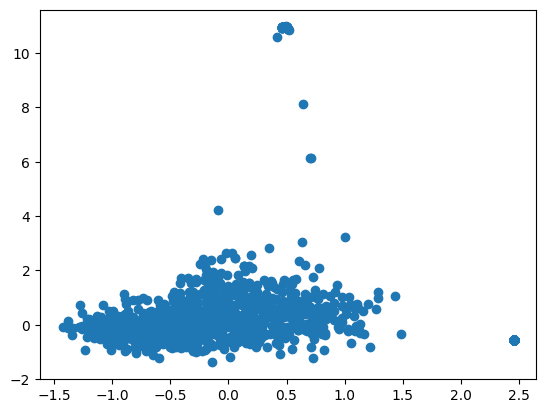

In [160]:
import matplotlib.pyplot as plt

plt.scatter(x_scaled[:, 0], x_scaled[:, 1])
plt.show()

In [161]:
df['ctr_group'] = df['ctr_group'].map({'Low': 0, 'High': 1})

In [162]:
# feature_columns = [col for col in df_x_final.columns if col != 'ctr_group']

In [163]:
from sklearn.model_selection import train_test_split

X = x_scaled
# X = np.tanh(df_x_final[feature_columns].values)
y = df['ctr_group']

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=0, stratify=y_temp
)

In [164]:
X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((892, 1818), (892,), (111, 1818), (111,), (112, 1818), (112,))

In [165]:
import xgboost as xgb
from sklearn.metrics import accuracy_score

In [166]:
print(type(X_train))
print(np.array(X_train).shape)

<class 'numpy.ndarray'>
(892, 1818)


In [167]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dval = xgb.DMatrix(X_val, label=y_val)
dtest = xgb.DMatrix(X_test, label=y_test)

In [168]:
params = {
    'objective': 'binary:logistic',  # Classification binary
    'eval_metric': 'logloss',        # ใช้ logloss เป็น metric
    'max_depth': 10,                 # ความลึกสูงสุดของต้นไม้
    'learning_rate': 0.05,           # อัตราการเรียนรู้
    # 'n_estimators': 2000,            # จำนวนต้นไม้
    'subsample': 0.8,                # ใช้ 80% ของข้อมูลในการฝึก
    'colsample_bytree': 0.8,         # ใช้ 80% ของฟีเจอร์ในการฝึก
    'gamma': 0.1,                    # การควบคุมการ split ของต้นไม้
    'scale_pos_weight': 1.0          # ถ้ามี imbalance ใน class
}

In [169]:
evals = [(dtrain, 'train'), (dval, 'eval')]

In [170]:
num_round = 1000  
early_stopping_rounds = 20

In [171]:
evals_result = {}

In [172]:
bst = xgb.train(
    params, 
    dtrain, 
    num_round, 
    evals=evals, 
    early_stopping_rounds=early_stopping_rounds,
    evals_result=evals_result,  
    verbose_eval=True
)

[0]	train-logloss:0.65379	eval-logloss:0.66692
[1]	train-logloss:0.61884	eval-logloss:0.63999
[2]	train-logloss:0.58614	eval-logloss:0.61970
[3]	train-logloss:0.55643	eval-logloss:0.59758
[4]	train-logloss:0.52820	eval-logloss:0.57618
[5]	train-logloss:0.50227	eval-logloss:0.55686
[6]	train-logloss:0.47798	eval-logloss:0.53918
[7]	train-logloss:0.45485	eval-logloss:0.52312
[8]	train-logloss:0.43387	eval-logloss:0.50792
[9]	train-logloss:0.41323	eval-logloss:0.49379
[10]	train-logloss:0.39423	eval-logloss:0.48214
[11]	train-logloss:0.37596	eval-logloss:0.47147
[12]	train-logloss:0.35930	eval-logloss:0.45942
[13]	train-logloss:0.34378	eval-logloss:0.45245
[14]	train-logloss:0.32854	eval-logloss:0.44050
[15]	train-logloss:0.31405	eval-logloss:0.43242
[16]	train-logloss:0.30078	eval-logloss:0.42441
[17]	train-logloss:0.28840	eval-logloss:0.41870
[18]	train-logloss:0.27667	eval-logloss:0.41071
[19]	train-logloss:0.26534	eval-logloss:0.40346
[20]	train-logloss:0.25487	eval-logloss:0.39467
[2

In [173]:
y_pred = bst.predict(dval)
y_pred_binary = (y_pred > 0.5).astype(int)  # binary class

In [174]:
accuracy = accuracy_score(y_val, y_pred_binary)
print(f"Validation Accuracy: {accuracy:.4f}")

Validation Accuracy: 0.8378


In [212]:
y_pred = bst.predict(dtest)
y_pred_binary = (y_pred > 0.5).astype(int)  # binary class

accuracy = accuracy_score(y_test, y_pred_binary)
print(f"Validation Accuracy: {accuracy:.4f}")

Validation Accuracy: 0.8571


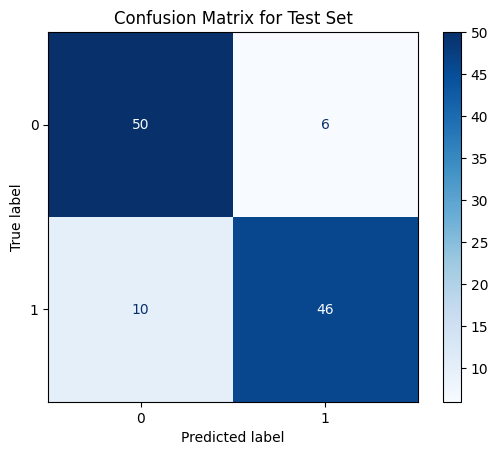

In [214]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred_binary)

# Create a display object
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])

disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for Test Set")
plt.show()

In [176]:
from sklearn.metrics import log_loss

In [177]:
from sklearn.neural_network import MLPClassifier


model = MLPClassifier(
    hidden_layer_sizes=(128, 64),
    activation='relu',
    solver='adam',
    learning_rate_init=0.001,
    max_iter=500,
    early_stopping=True,   
    # validation_fraction=0.2,  
    # verbose=True
)

In [178]:
model.fit(X_train, y_train)

MLPClassifier(early_stopping=True, hidden_layer_sizes=(128, 64), max_iter=500)

In [179]:
y_pred = model.predict(X_val)
y_pred2 = model.predict(X_test)
print("Validation Accuracy:", accuracy_score(y_val, y_pred))
print("Test Accuracy:", accuracy_score(y_test, y_pred2))

Validation Accuracy: 0.8378378378378378
Test Accuracy: 0.8214285714285714


In [180]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

In [181]:
k_values = [1, 3, 5, 7, 9, 11, 13, 15]
best_k = None
best_acc = 0
best_model = None

for k in k_values:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    y_val_pred = model.predict(X_val)
    acc = accuracy_score(y_val, y_val_pred)
    print(f"k = {k}, Validation Accuracy = {acc:.4f}")

    if acc > best_acc:
        best_acc = acc
        best_k = k
        best_model = model

print(f"\nBest k = {best_k}, Best Validation Accuracy = {best_acc:.4f}")

y_test_pred = best_model.predict(X_test)
test_acc = accuracy_score(y_test, y_test_pred)
print(f"Test Accuracy = {test_acc:.4f}")


k = 1, Validation Accuracy = 0.7928
k = 3, Validation Accuracy = 0.8559
k = 5, Validation Accuracy = 0.8559
k = 7, Validation Accuracy = 0.8468
k = 9, Validation Accuracy = 0.8739
k = 11, Validation Accuracy = 0.8468
k = 13, Validation Accuracy = 0.8468
k = 15, Validation Accuracy = 0.8559

Best k = 9, Best Validation Accuracy = 0.8739
Test Accuracy = 0.8214


In [182]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(C=0.1, penalty='l2', max_iter=1000, solver='lbfgs')
model.fit(X_train, y_train)

y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)

y_train_proba = model.predict_proba(X_train)
y_val_proba = model.predict_proba(X_val)
y_test_proba = model.predict_proba(X_test)

train_acc = accuracy_score(y_train, y_train_pred)
val_acc = accuracy_score(y_val, y_val_pred)
test_acc = accuracy_score(y_test, y_test_pred)

train_loss = log_loss(y_train, y_train_proba)
val_loss = log_loss(y_val, y_val_proba)
test_loss = log_loss(y_test, y_test_proba)

print(f"Train Accuracy:      {train_acc:.4f} | Loss: {train_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f} | Loss: {val_loss:.4f}")
print(f"Test Accuracy:       {test_acc:.4f} | Loss: {test_loss:.4f}")


Train Accuracy:      0.9955 | Loss: 0.0602
Validation Accuracy: 0.8649 | Loss: 0.3505
Test Accuracy:       0.9107 | Loss: 0.2850


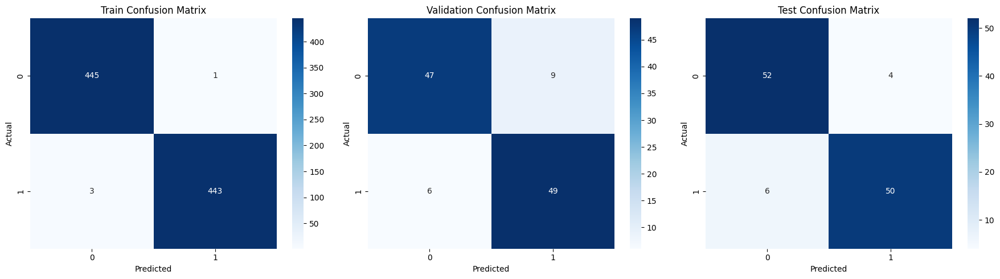

In [183]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm_train = confusion_matrix(y_train, y_train_pred)
cm_val = confusion_matrix(y_val, y_val_pred)
cm_test = confusion_matrix(y_test, y_test_pred)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))

sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues', ax=axs[0])
axs[0].set_title("Train Confusion Matrix")
axs[0].set_xlabel("Predicted")
axs[0].set_ylabel("Actual")

sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues', ax=axs[1])
axs[1].set_title("Validation Confusion Matrix")
axs[1].set_xlabel("Predicted")
axs[1].set_ylabel("Actual")

sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', ax=axs[2])
axs[2].set_title("Test Confusion Matrix")
axs[2].set_xlabel("Predicted")
axs[2].set_ylabel("Actual")

plt.tight_layout()
plt.show()


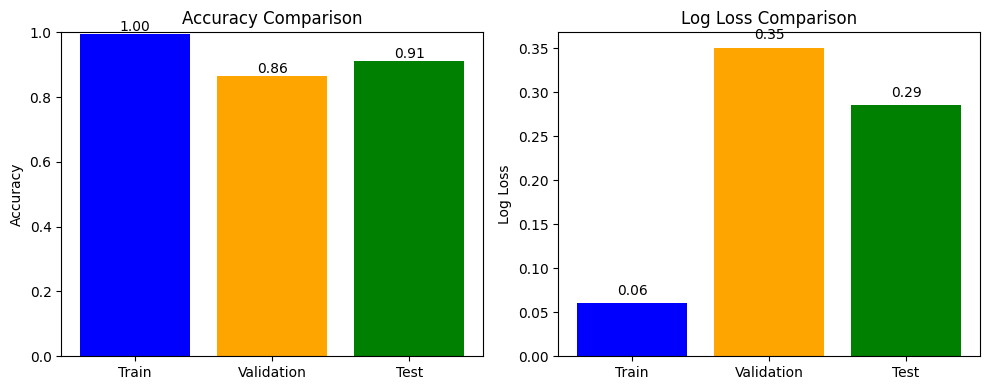

In [184]:
import matplotlib.pyplot as plt

metrics = ['Train', 'Validation', 'Test']
accuracies = [train_acc, val_acc, test_acc]
losses = [train_loss, val_loss, test_loss]

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.bar(metrics, accuracies, color=['blue', 'orange', 'green'])
plt.ylim(0, 1)
plt.title('Accuracy Comparison')
plt.ylabel('Accuracy')
for i, acc in enumerate(accuracies):
    plt.text(i, acc + 0.01, f"{acc:.2f}", ha='center')

plt.subplot(1, 2, 2)
plt.bar(metrics, losses, color=['blue', 'orange', 'green'])
plt.title('Log Loss Comparison')
plt.ylabel('Log Loss')
for i, loss in enumerate(losses):
    plt.text(i, loss + 0.01, f"{loss:.2f}", ha='center')

plt.tight_layout()
plt.show()


In [185]:
from sklearn.svm import SVC

svm_model = SVC(kernel='rbf', C=1.0, gamma='scale', tol=1e-4, class_weight='balanced', verbose=True)  # RBF kernel เป็น default
svm_model.fit(X_train, y_train)
y_val_pred = svm_model.predict(X_val)
y_test_pred = svm_model.predict(X_test)

val_acc = accuracy_score(y_val, y_val_pred)
test_acc = accuracy_score(y_test, y_test_pred)

print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

[LibSVM]*
optimization finished, #iter = 709
obj = -207.834090, rho = 0.636167
nSV = 412, nBSV = 206
Total nSV = 412
Validation Accuracy: 0.8649
Test Accuracy: 0.8750


In [186]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=42)

rf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [187]:
y_pred = rf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.4f}')

Accuracy: 0.8571


In [188]:
import shap

In [189]:
feature_columns = [col for col in df_x_final.columns if col != 'ctr_group']

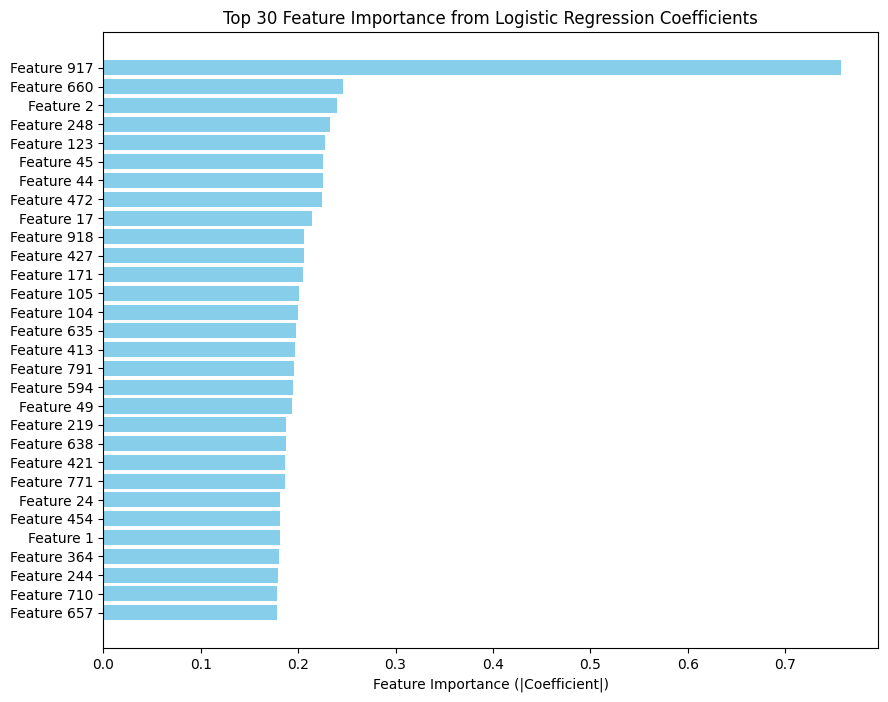

In [190]:
import matplotlib.pyplot as plt
import numpy as np

coefficients = model.coef_.flatten()
feature_importance = np.abs(coefficients)
indices = np.argsort(feature_importance)[::-1]

max_features = 30
indices = indices[:max_features]

try:
    feature_names
except NameError:
    feature_names = [f"Feature {i}" for i in range(len(coefficients))]

sorted_feature_names = [feature_names[i] for i in indices]
sorted_importance = feature_importance[indices]

plt.figure(figsize=(10, 8))
plt.barh(sorted_feature_names, sorted_importance, color='skyblue')
plt.gca().invert_yaxis()  # ฟีเจอร์สำคัญสุดขึ้นบน
plt.xlabel("Feature Importance (|Coefficient|)")
plt.title(f"Top {max_features} Feature Importance from Logistic Regression Coefficients")
plt.show()


In [191]:
print(feature_columns[525])  
print(df_x_final.columns[525])  

word_emb_515
word_emb_515


In [192]:
# explainer = shap.LinearExplainer(model, X_train, feature_perturbation="interventional")
# shap_values = explainer.shap_values(X)
# shap.summary_plot(shap_values, X)


In [215]:
explainer = shap.TreeExplainer(bst, feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(X) 

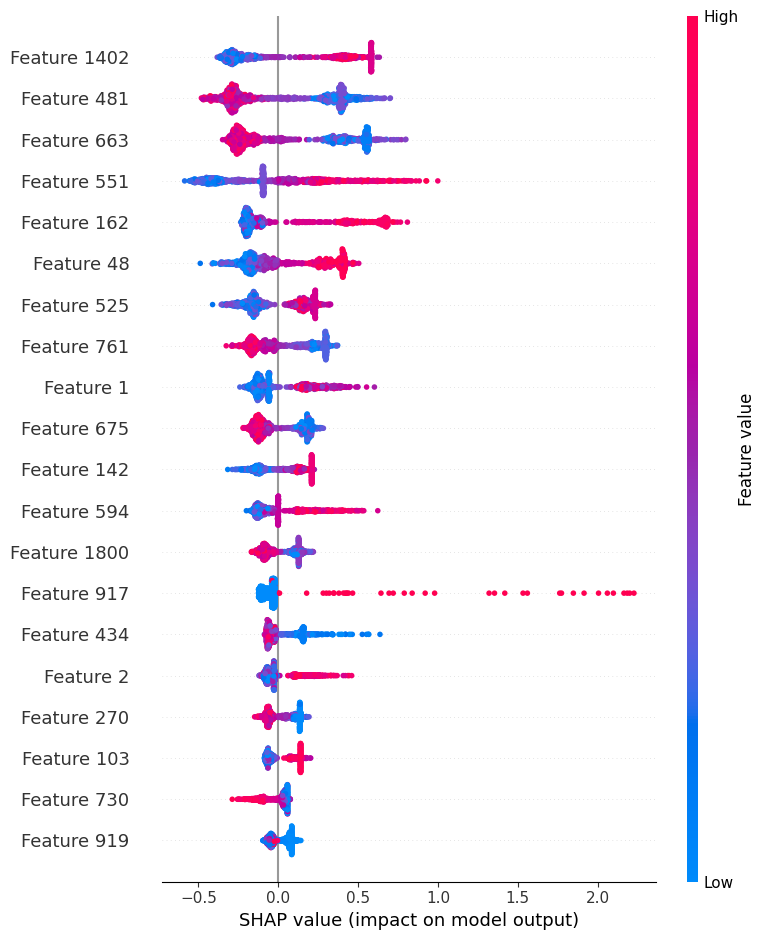

In [216]:
shap.summary_plot(shap_values, X)

In [195]:
# latent_dim = X_train.shape[1]
# latent_shap = shap_values[:, :latent_dim]

# plt.figure(figsize=(12, 4))
# plt.bar(range(latent_dim), latent_shap[0])  
# plt.title("SHAP values for dimensions")
# plt.xlabel("Latent Dimension")
# plt.ylabel("SHAP Value")
# plt.show()

In [196]:
# print("Shape of shap_values:", shap_values.shape)
# print("Shape of image_tensor:", image_tensor.shape)

In [197]:
# explainer = shap.TreeExplainer(bst, feature_perturbation="tree_path_dependent")
# shap_values = explainer.shap_values(X)  # X.shape = (1115, 1818) 


# image_tensor = torch.load("/kaggle/input/datath/datasetX3_reverse.pt") # Shape = [1115, 3, 256, 256]
# print(f"Original image tensor shape: {image_tensor.shape}")
# print(f"Original image tensor range: [{image_tensor.min().item()}, {image_tensor.max().item()}]")

# normalized_images = (image_tensor + 1) / 2
# print(f"Normalized image tensor range: [{normalized_images.min().item()}, {normalized_images.max().item()}]")

# images_np = normalized_images.numpy()

# df_shap = pd.DataFrame(shap_values, columns=feature_columns)
# df_shap['img_id'] = df['img_id'] 

In [198]:
import torchvision.models as models
import cv2
from PIL import Image

In [199]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [200]:
def reverse_normalize(tensor_img):
    """
    Reverse normalization from [-1, 1] → [0, 1]
    Supports Tensor shape (C, H, W) or (N, C, H, W)
    """
    return (tensor_img * 0.5) + 0.5

In [201]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0]

        def forward_hook(module, input, output):
            self.activations = output

        target_layer.register_forward_hook(forward_hook)
        target_layer.register_backward_hook(backward_hook)

    def generate(self, input_image, target_class=None):
        self.model.zero_grad()
        input_image = input_image.requires_grad_(True)

        output = self.model(input_image)
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        one_hot_output = torch.zeros_like(output)
        one_hot_output[0][target_class] = 1
        output.backward(gradient=one_hot_output, retain_graph=True)

        gradients = self.gradients.cpu().data.numpy()[0]
        activations = self.activations.cpu().data.numpy()[0]
        weights = np.mean(gradients, axis=(1, 2))
        cam = np.zeros(activations.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * activations[i]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, (input_image.shape[2], input_image.shape[3]))
        cam = cam / cam.max() if cam.max() != 0 else cam  # Avoid division by zero
        return cam

In [202]:
def plot_heatmap(image, heatmap, img_id, alpha=0.5, save_path=None, dpi=300):
    image = image.permute(1, 2, 0).cpu().numpy()  # [3, 256, 256] -> [256, 256, 3]
    
    # Apply JET colormap to heatmap
    heatmap_normalized = heatmap / heatmap.max() if heatmap.max() != 0 else heatmap
    heatmap_uint8 = np.uint8(255 * heatmap_normalized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    heatmap_colored = heatmap_colored / 255.0

    # Blend heatmap with original image
    superimposed_img = heatmap_colored * alpha + image
    superimposed_img = np.clip(superimposed_img, 0, 1)

    # Plot original and superimposed images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Original Image (ID: {img_id})")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=dpi)
        
    plt.show()

In [203]:
cnn_model = models.resnet101(pretrained=True)
cnn_model.eval()
cnn_model = cnn_model.to(device)

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.


In [204]:
image_tensor = torch.load("/kaggle/input/datath/datasetX3_reverse.pt")  # [1115, 3, 256, 256]
print(f"Original image tensor shape: {image_tensor.shape}")
print(f"Original image tensor range: [{image_tensor.min().item()}, {image_tensor.max().item()}]")

normalized_images = reverse_normalize(image_tensor)  # Normalize to [0, 1]
print(f"Normalized image tensor range: [{normalized_images.min().item()}, {normalized_images.max().item()}]")

images_np = normalized_images.numpy()

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Original image tensor shape: torch.Size([1115, 3, 256, 256])
Original image tensor range: [-1.0, 1.0]
Normalized image tensor range: [0.0, 1.0]


In [205]:
# Get SHAP values and DataFrame (from your code)
explainer = shap.TreeExplainer(bst, feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(X)  # X.shape = (1115, 1818)
df_shap = pd.DataFrame(shap_values, columns=feature_columns)
df_shap['img_id'] = df['img_id']

In [206]:
X_test_dmatrix = xgb.DMatrix(X)
raw_scores = bst.predict(X_test_dmatrix, output_margin=True)
confidence_scores = 1 / (1 + np.exp(-raw_scores))
print(f"Confidence scores shape: {confidence_scores.shape}")
print(f"Confidence scores range: [{confidence_scores.min():.4f}, {confidence_scores.max():.4f}]")

# Get indices for top 5 and bottom 5 samples
top_indices = np.argsort(confidence_scores)[-10:][::-1]
bottom_indices = np.argsort(confidence_scores)[:10]
print(f"Top 5 indices: {top_indices}")
print(f"Bottom 5 indices: {bottom_indices}")

Confidence scores shape: (1115,)
Confidence scores range: [0.0033, 0.9966]
Top 5 indices: [ 992  919  149  846  999  220  669 1028  440  918]
Bottom 5 indices: [1026   52  395 1083  407  227  391  475  651  693]


In [207]:
target_layer = cnn_model.layer4[-1]
grad_cam = GradCAM(cnn_model, target_layer)

In [208]:
os.makedirs("new_folder", exist_ok=True)

Visualizing Top 5 Samples (Highest Model Confidence)


Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


Sample Index: 992, Img ID: 41421a3c44148385ee73c1ce76877874, Confidence: 0.9966


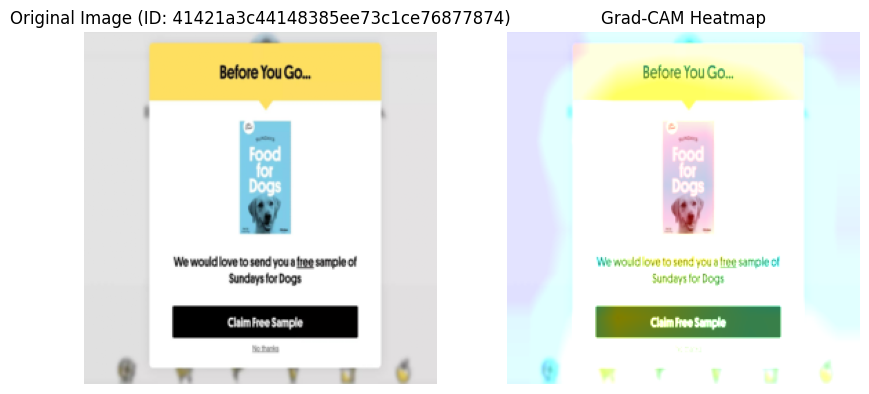

Sample Index: 919, Img ID: 46758a53863e8ab7a1fdabb998fa3892, Confidence: 0.9966


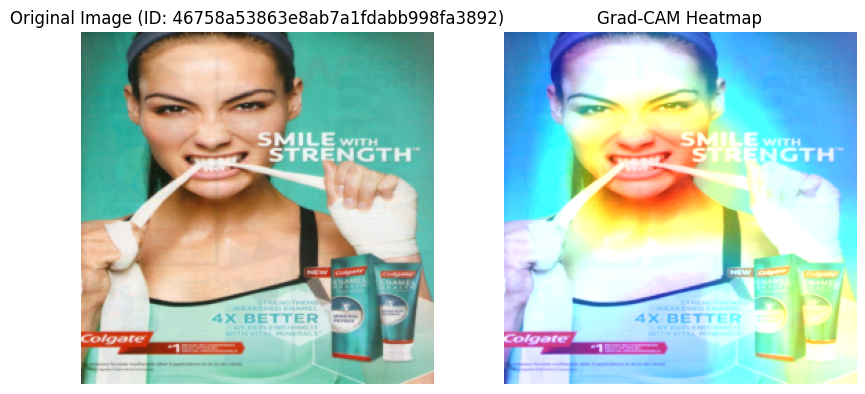

Sample Index: 149, Img ID: bf36e3ca2425524f888153e405cbf34e, Confidence: 0.9966


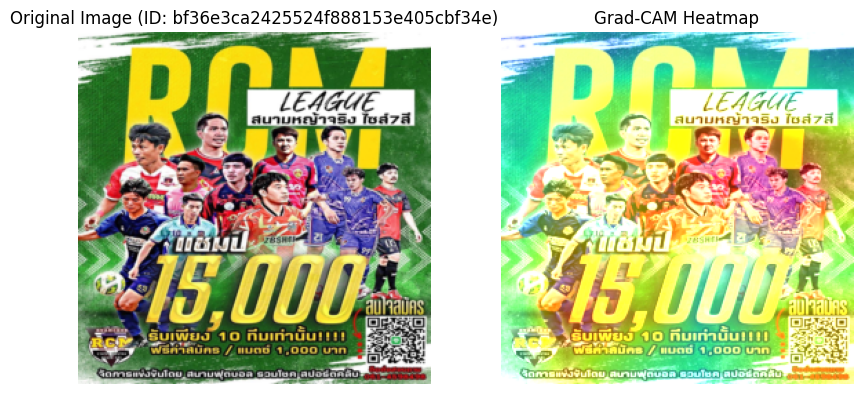

Sample Index: 846, Img ID: 6a9749db415f7db56e1d730237bb342e, Confidence: 0.9966


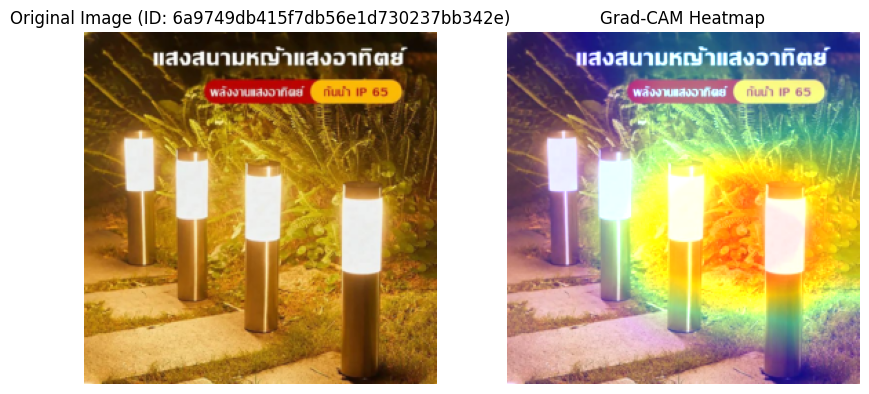

Sample Index: 999, Img ID: d0dfe3a31775856996f68952ed46beb8, Confidence: 0.9966


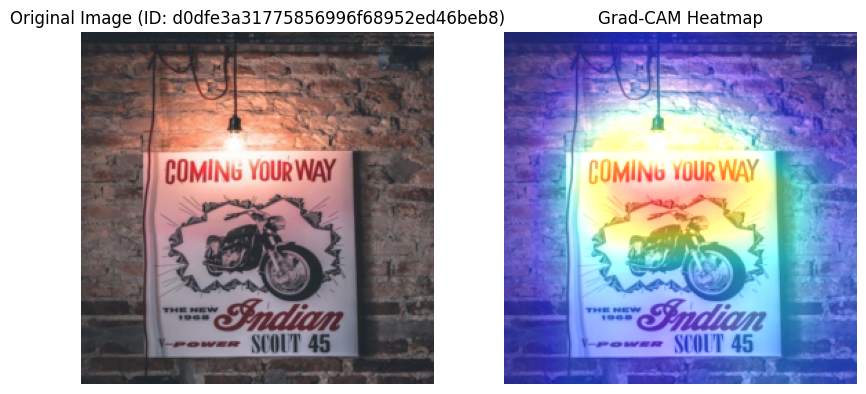

Sample Index: 220, Img ID: 782aa0b04102407f6ef62408a4aea38b, Confidence: 0.9966


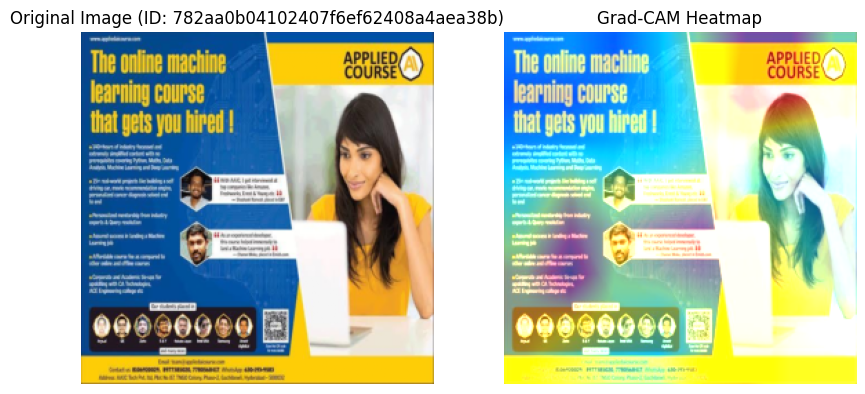

Sample Index: 669, Img ID: 4f2023694d0750f0cd90da32d52b5542, Confidence: 0.9966


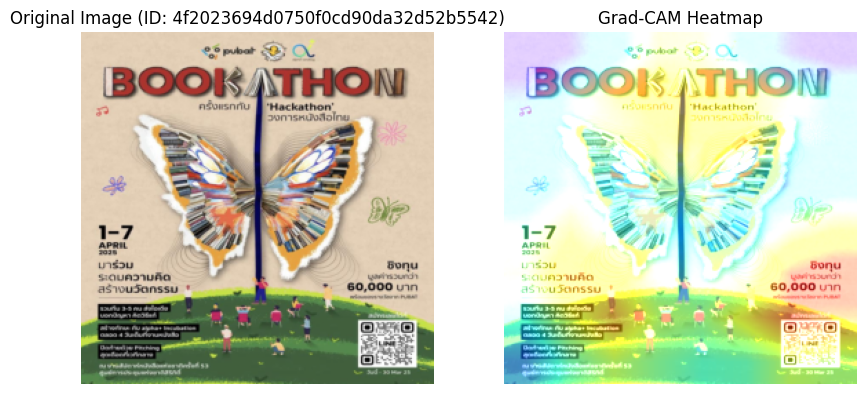

Sample Index: 1028, Img ID: 3cf53957816a6a43a3917d2a5218b415, Confidence: 0.9966


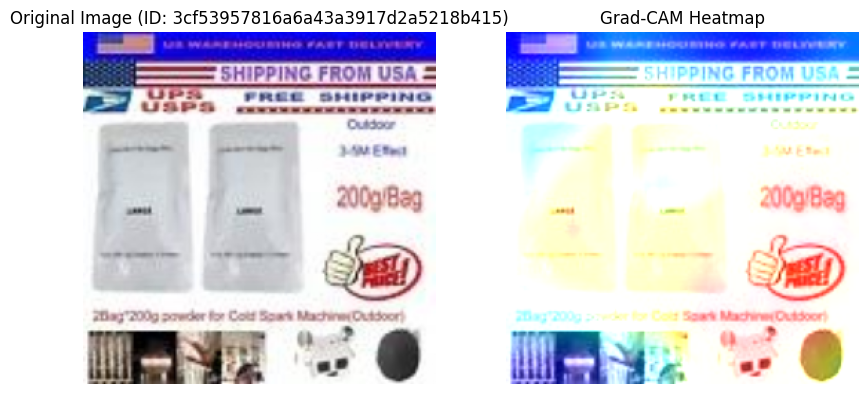

Sample Index: 440, Img ID: 9274433ab69457aa8bf25e882067af8f, Confidence: 0.9966


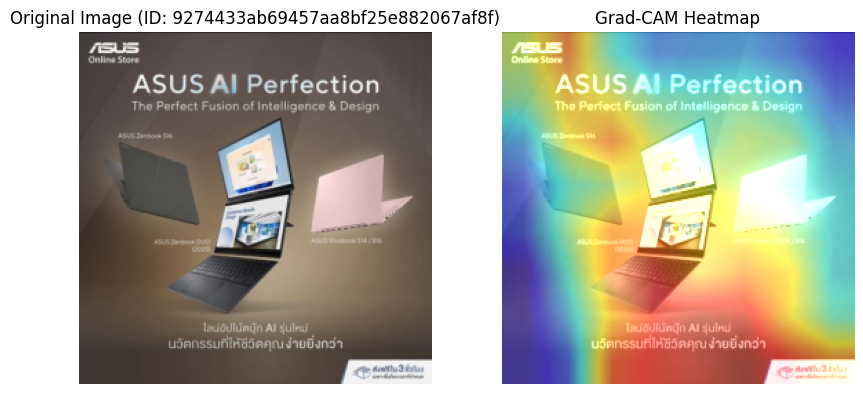

Sample Index: 918, Img ID: 26e4986603e1a22eddce6532ff3cd02a, Confidence: 0.9966


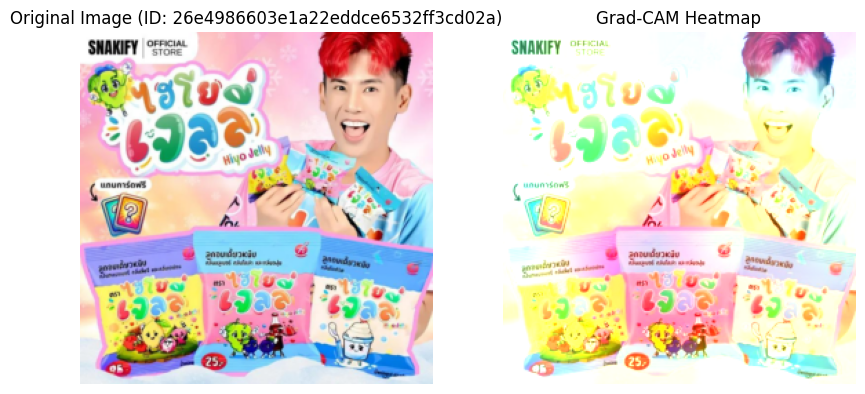

In [209]:
print("Visualizing Top 5 Samples (Highest Model Confidence)")
for idx in top_indices:
    sample_image = normalized_images[idx:idx+1].to(device)
    heatmap = grad_cam.generate(sample_image)
    img_id = df_shap['img_id'].iloc[idx]
    confidence = confidence_scores[idx]
    print(f"Sample Index: {idx}, Img ID: {img_id}, Confidence: {confidence:.4f}")
    save_path = f"new_folder/top_heatmap_{img_id}_conf{confidence:.2f}.png"
    plot_heatmap(normalized_images[idx], heatmap, img_id, save_path=save_path)

Visualizing Bottom 5 Samples (Lowest Model Confidence)
Sample Index: 1026, Img ID: 25d5e6afede2b0ab520ca4bc775f0fd9, Confidence: 0.0033


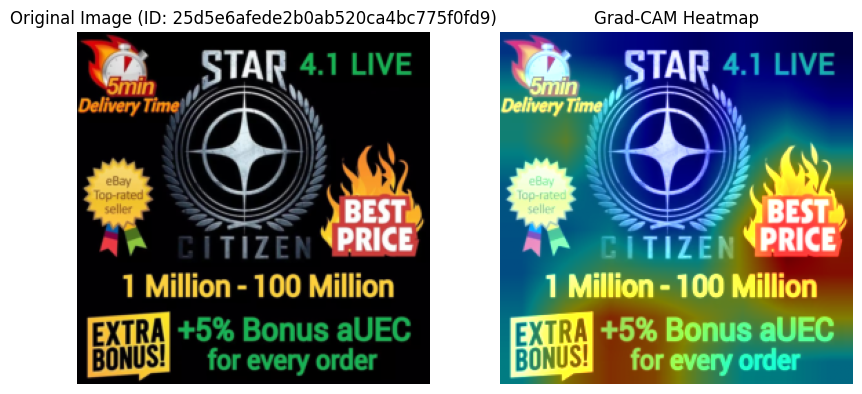

Sample Index: 52, Img ID: 562872781b8f3a1f44b7125056e31ede, Confidence: 0.0033


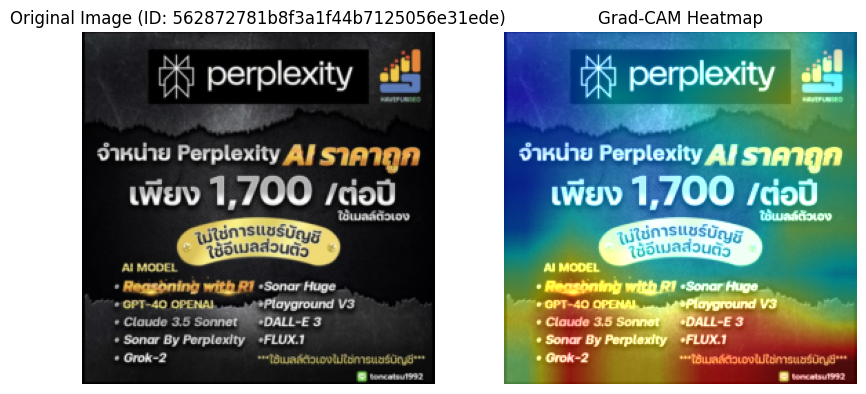

Sample Index: 395, Img ID: 3b65a5bbbcb8899d54437f62e89e9ea6, Confidence: 0.0036


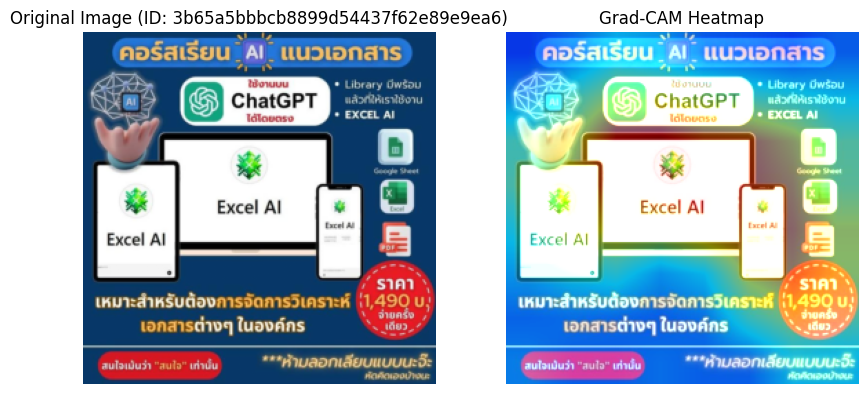

Sample Index: 1083, Img ID: 0812ecb2aaab464a86dc9bc2f714c803, Confidence: 0.0036


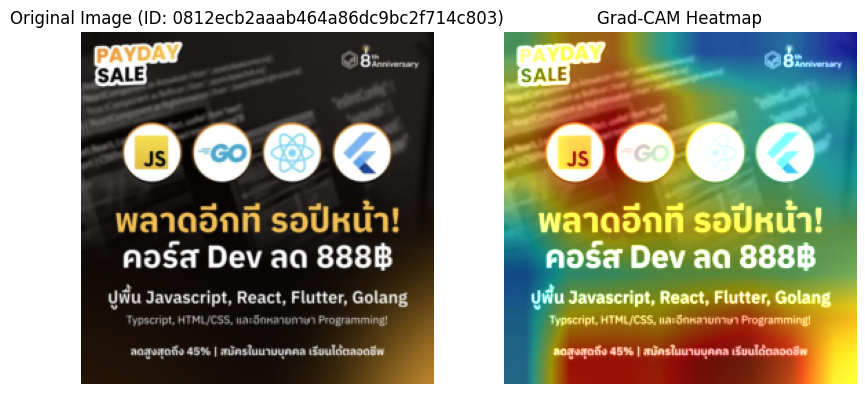

Sample Index: 407, Img ID: c91ea2e50f53845e8506a3b60666ae25, Confidence: 0.0037


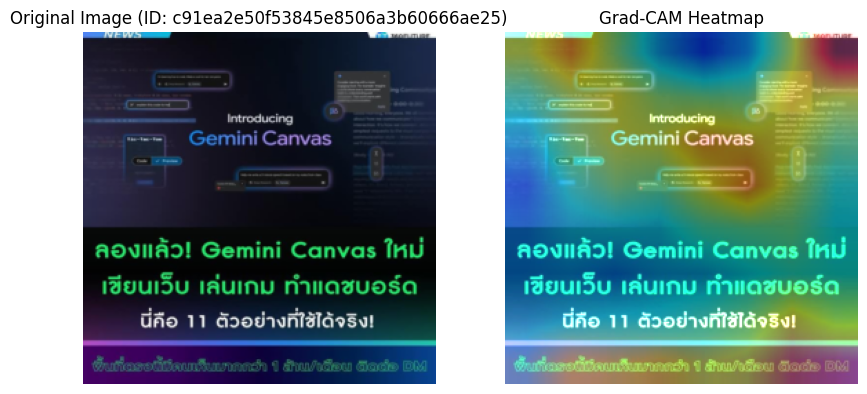

Sample Index: 227, Img ID: 2d8300a9cf8ce1f4d4f8272a1318cbf1, Confidence: 0.0037


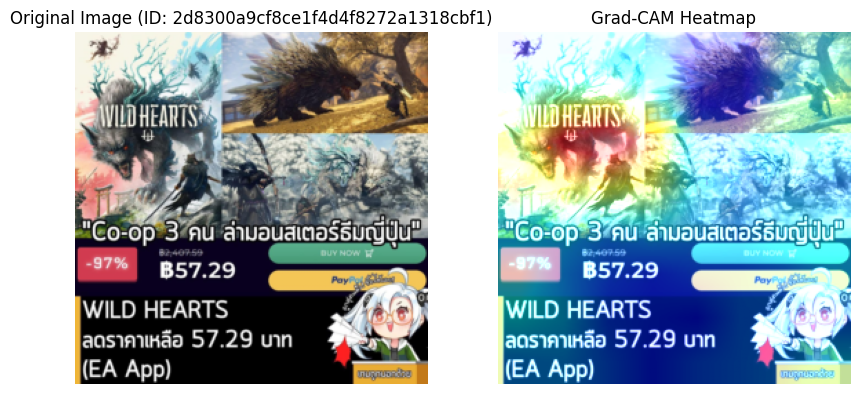

Sample Index: 391, Img ID: 6bbe6b680ae45b6f8bad8f108f31d30a, Confidence: 0.0038


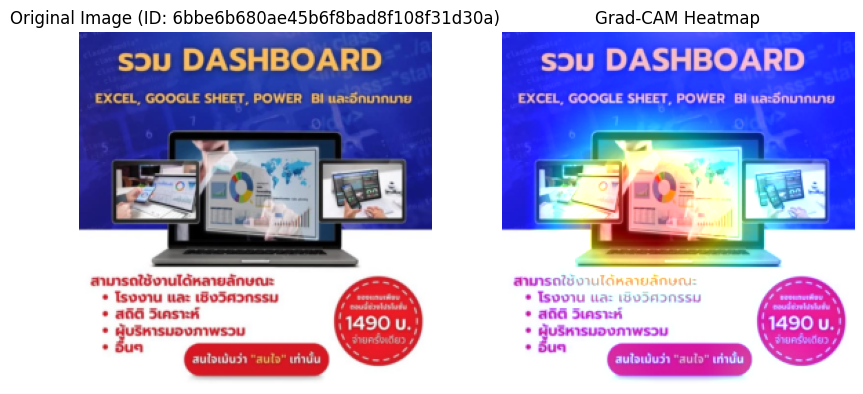

Sample Index: 475, Img ID: eb1619c4edf135f616066cb42cb53869, Confidence: 0.0038


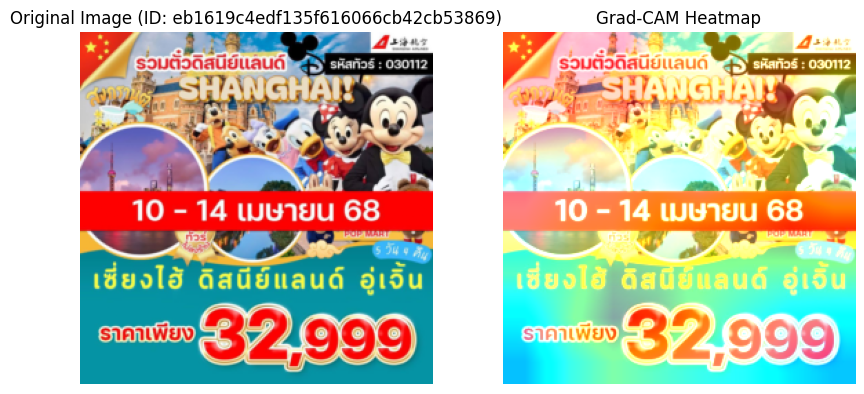

Sample Index: 651, Img ID: 383bf13d2e42969d08a59afe917a300a, Confidence: 0.0038


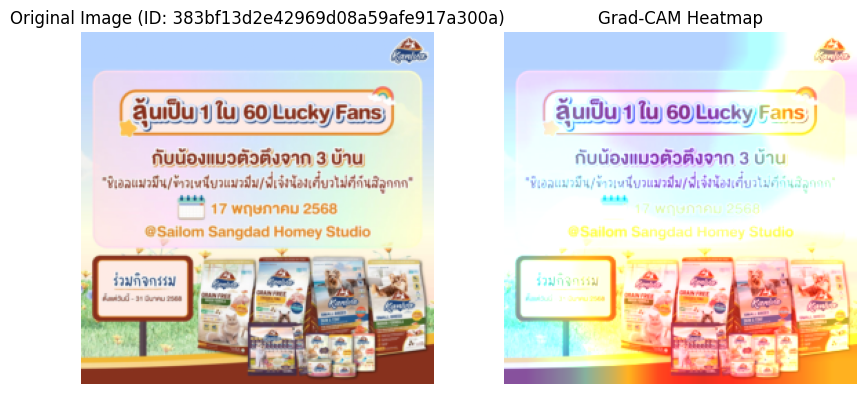

Sample Index: 693, Img ID: ecc63fa9bc7ca30c1d1468e06f499085, Confidence: 0.0040


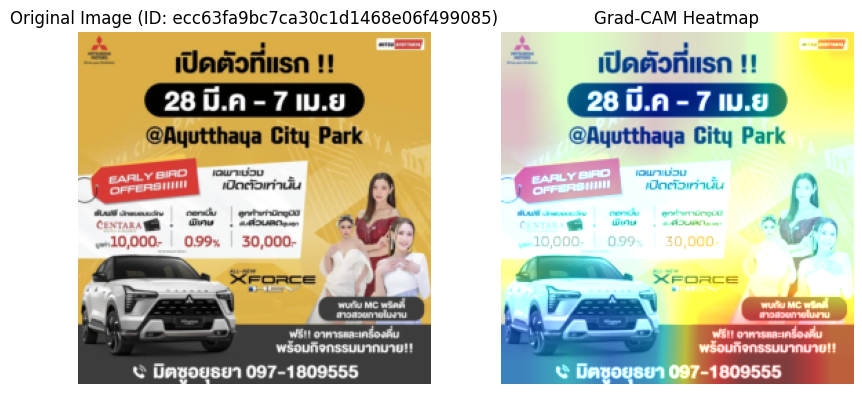

In [210]:
print("Visualizing Bottom 5 Samples (Lowest Model Confidence)")
for idx in bottom_indices:
    sample_image = normalized_images[idx:idx+1].to(device)  # [1, 3, 256, 256]
    heatmap = grad_cam.generate(sample_image)
    img_id = df_shap['img_id'].iloc[idx]
    confidence = confidence_scores[idx]
    print(f"Sample Index: {idx}, Img ID: {img_id}, Confidence: {confidence:.4f}")
    # plot_heatmap(normalized_images[idx], heatmap, img_id)
    save_path = f"new_folder/bot_heatmap_{img_id}_conf{confidence:.2f}.png"
    plot_heatmap(normalized_images[idx], heatmap, img_id, save_path=save_path)